<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Комментарий ревьюера</b>


Привет! Давай знакомиться! Меня зовут Дмитрий Махортов, и я буду проверять твой проект.  Хотя мы уже знакомы, я проверял один из твоих проектов ))

Моя основная цель — не указать на совершенные тобою ошибки, а поделиться своим опытом и помочь тебе погрузиться в увлекательный мир работы с данными и вырасти в крепкого профи. Это отдаленная цель. А ближайшая - сделать твою работу еще лучше )).
   
    
Все ключевые этапы в работе выполнены, и я вижу что с проектом ты справшяешься. Есть моменты, которые нужно доработать, но я уверен, у тебя все получится.
        
Расскажу как обычно проходит проверка:    
Бывают моменты, которые требуют пристального внимания. Комментарии по ним выделены <span style='background-color:#F7B3A4'> красным цветом </span> и обозначены значком 🛑. После их доработки проект будет принят.  🙂
 
<span style='background-color:#B7EBA7'> Зеленым цветом </span> и значком ✅ отмечены удачные и элегантные решения, на которые можно опираться в будущих проектах. Или советы «со звездочкой», которые помогут тебе в будущем.

<span style='background-color:#F9EDA6'>Жёлтым цветом </span> и значком ⚠️ выделено то, что в следующий раз можно сделать по-другому. Ты можешь учесть эти комментарии при выполнении будущих заданий или доработать проект сейчас (однако это не обязательно).

Давай работать над проектом в диалоге: **если ты что-то меняешь в проекте по моим рекомендациям — пиши об этом**. Выбери для своих комментариев какой-то заметный цвет, так мне будет легче отследить изменения. Пожалуйста, **не перемещай, не изменяй и не удаляй мои комментарии**. Всё это поможет выполнить повторную проверку твоего проекта оперативнее. 
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
Можешь использовать этот комментарий. Просто удали этот текст и вместо него напиши свой 🙂

</div>

# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

Данные находятся [здесь](https://st.yandex-team.ru/DS-6856).

В файле `train_dataset.csv` собрана информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import scipy
import re
import torch
import transformers
import sys
import spacy
import os
import torchvision.models as models
import tensorflow as tf
import nltk

from nltk.corpus import stopwords
from sklearn.linear_model import Ridge
from sklearn.pipeline import make_pipeline
from sklearn.svm import LinearSVR
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import Ridge
from torchvision import transforms
from PIL import Image
from pathlib import Path
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.models import Sequential
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedShuffleSplit
from sklearn.linear_model import LinearRegression
from numpy.random import RandomState
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.utils import shuffle
from sklearn.naive_bayes import ComplementNB
from sklearn.pipeline import Pipeline
from tqdm import notebook
from tqdm.notebook import tqdm
from transformers import BertTokenizer, TFBertModel
from sklearn.model_selection import GroupShuffleSplit
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler


tqdm.pandas()

import random
import warnings
warnings.filterwarnings('ignore')

tqdm.pandas()
plt.style.use('ggplot')

/opt/homebrew/anaconda3/lib/python3.10/site-packages/torchvision/io/image.py:13: UserWarning: Failed to load image Python extension: 'dlopen(/opt/homebrew/anaconda3/lib/python3.10/site-packages/torchvision/image.so, 0x0006): Symbol not found: __ZN3c106detail19maybe_wrap_dim_slowIxEET_S2_S2_b
  Referenced from: <9A4710B9-0DA3-36BB-9129-645F282E64B2> /opt/homebrew/anaconda3/lib/python3.10/site-packages/torchvision/image.so
  Expected in:     <DB251723-D0A7-3D18-91AD-79131BDBDDBC> /opt/homebrew/anaconda3/lib/python3.10/site-packages/torch/lib/libc10.dylib'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, все нужные библиотеки импортированы в начале ноутбука.Это хорошая практика.</div>

## Прочитаем данные

In [2]:
PATH = '/Users/eliza/Downloads/to_upload'

In [3]:
train_dataset_path = os.path.join(PATH, 'train_dataset.csv')
CrowdAnnotations_path = os.path.join(PATH, 'CrowdAnnotations.tsv')
ExpertAnnotations_path = os.path.join(PATH, 'ExpertAnnotations.tsv')
test_queries_path = os.path.join(PATH, 'test_queries.csv')
test_images_path = os.path.join(PATH, 'test_images.csv')

train_dataset = pd.read_csv(train_dataset_path)
CrowdAnnotations = pd.read_csv(CrowdAnnotations_path, sep='\t', header=None)
ExpertAnnotations = pd.read_csv(ExpertAnnotations_path, sep='\t', header=None)
test_queries = pd.read_csv(test_queries_path, sep='|', index_col=0)
test_images = pd.read_csv(test_images_path, sep='|')


<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
Очень "больная тема" - это загрузка данных и использование путей.Очевидно, что на моей машине (и скорее всего машине любого другого пользователя) пути к данным будут другие. И это "рабочая ситуация для большинства проектов. Решается она следующим образом:
 
    
  - Путь к директории с данными  должен быть задан в константе, в самом начале работы. Тогда ревьюеру (или любому другому пользователю твоего ноутбука, даже тебе самому, если нужно будет провести презентацию руководителю на другом компьютере) нужно будет изменить только этот путь.
  - Все остальные пути внутри ноутбука должны быть созданы с исопользованием этой константы, а не заданы жестко (есть сленговое определение "хардкод").  Более  того, настоятельно рекомендую для создания сложных путей вместо простой конкатерации строк с исползованием '/' использовать os.path.join(), тогда код будет одинаково надежно работать и в среде Windows и Linux (MacOS).
   
Чтобы запустить твой код при проверке я менял код по всему ноутбуку. Прошу тебя внести изменения так, чтобы путь к данным нужно было изменять всего один раз.


</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   
Исправила

</div>

In [4]:
# выведим на экран информацию
def apply_head_info(datasets):
    for dataset_name, dataset in datasets.items():
        print(f"Dataset: {dataset_name}")
        print("Head:")
        print(dataset.head())
        print("\n")
        print("Info:")
        dataset.info()
        print("\n")

datasets = {
    'train_dataset': train_dataset,
    'CrowdAnnotations': CrowdAnnotations,
    'ExpertAnnotations': ExpertAnnotations,
    'test_queries': test_queries,
    'test_images': test_images
}

apply_head_info(datasets)

Dataset: train_dataset
Head:
                       image                     query_id  \
0  1056338697_4f7d7ce270.jpg  2549968784_39bfbe44f9.jpg#2   
1  1262583859_653f1469a9.jpg  2549968784_39bfbe44f9.jpg#2   
2  2447284966_d6bbdb4b6e.jpg  2549968784_39bfbe44f9.jpg#2   
3  2549968784_39bfbe44f9.jpg  2549968784_39bfbe44f9.jpg#2   
4  2621415349_ef1a7e73be.jpg  2549968784_39bfbe44f9.jpg#2   

                                          query_text  
0  A young child is wearing blue goggles and sitt...  
1  A young child is wearing blue goggles and sitt...  
2  A young child is wearing blue goggles and sitt...  
3  A young child is wearing blue goggles and sitt...  
4  A young child is wearing blue goggles and sitt...  


Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object


In [5]:
# Проверим количество уникальных значений.

# Количество уникальных изображений в обучающем наборе
train_unique_images = train_dataset['image'].nunique()
print("Количество уникальных изображений в обучающем наборе:", train_unique_images)

# Количество уникальных изображений в тестовом наборе
test_unique_images = test_queries['image'].nunique()
print("Количество уникальных изображений в тестовом наборе:", test_unique_images)

# Количество уникальных значений в датасете CrowdAnnotations
crowd_annotations_unique = CrowdAnnotations[0].nunique()
print("Количество уникальных значений в датасете CrowdAnnotations:", crowd_annotations_unique)

# Количество уникальных значений в датасете ExpertAnnotations
expert_annotations_unique = ExpertAnnotations[0].nunique()
print("Количество уникальных значений в датасете ExpertAnnotations:", expert_annotations_unique)

Количество уникальных изображений в обучающем наборе: 1000
Количество уникальных изображений в тестовом наборе: 100
Количество уникальных значений в датасете CrowdAnnotations: 1000
Количество уникальных значений в датасете ExpertAnnotations: 1000


In [6]:
# Проверю на дубликаты

# Проверка дубликатов в обучающем наборе
train_duplicates = train_dataset.duplicated().any()
print("Наличие дубликатов в обучающем наборе:", train_duplicates)

# Проверка дубликатов в тестовом наборе
test_duplicates = test_queries.duplicated().any()
print("Наличие дубликатов в тестовом наборе:", test_duplicates)

# Проверка дубликатов в датасете CrowdAnnotations
crowd_annotations_duplicates = CrowdAnnotations.duplicated().any()
print("Наличие дубликатов в датасете CrowdAnnotations:", crowd_annotations_duplicates)

# Проверка дубликатов в датасете ExpertAnnotations
expert_annotations_duplicates = ExpertAnnotations.duplicated().any()
print("Наличие дубликатов в датасете ExpertAnnotations:", expert_annotations_duplicates)

Наличие дубликатов в обучающем наборе: False
Наличие дубликатов в тестовом наборе: False
Наличие дубликатов в датасете CrowdAnnotations: False
Наличие дубликатов в датасете ExpertAnnotations: False


In [7]:
# Посмотрю пропуски

# Проверка пропусков в обучающем наборе
train_missing_values = train_dataset.isnull().any()
print("Наличие пропусков в обучающем наборе:")
print(train_missing_values)

# Проверка пропусков в тестовом наборе
test_missing_values = test_queries.isnull().any()
print("Наличие пропусков в тестовом наборе:")
print(test_missing_values)

Наличие пропусков в обучающем наборе:
image         False
query_id      False
query_text    False
dtype: bool
Наличие пропусков в тестовом наборе:
query_id      False
query_text    False
image         False
dtype: bool


In [8]:
# Количество уникальных описаний, которые есть в train и test

# Получение уникальных текстовых описаний в обучающем наборе
train_unique_descriptions = train_dataset['query_text'].nunique()

# Получение уникальных текстовых описаний в тестовом наборе
test_unique_descriptions = test_queries['query_text'].nunique()

# Проверка пересечения уникальных описаний в обоих наборах
common_unique_descriptions = set(train_dataset['query_text']).intersection(set(test_queries['query_text']))

# Вывод количества уникальных описаний, которые есть в обоих наборах
print("Количество уникальных описаний, которые есть в обоих наборах:", len(common_unique_descriptions))

Количество уникальных описаний, которые есть в обоих наборах: 0


In [9]:
# Количество уникальных фото, которые есть в train и test

# Получение уникальных фото в обучающем наборе
train_unique_descriptions = train_dataset['image'].nunique()

# Получение уникальных фото в тестовом наборе
test_unique_descriptions = test_queries['image'].nunique()

# Проверка пересечения уникальных фото в обоих наборах
common_unique_descriptions = set(train_dataset['image']).intersection(set(test_queries['image']))

# Вывод количества уникальных фото, которые есть в обоих наборах
print("Количество уникальных фото, которые есть в обоих наборах:", len(common_unique_descriptions))

Количество уникальных фото, которые есть в обоих наборах: 0


In [10]:
# Отображение фотографий

train_datagen = ImageDataGenerator(rescale=1./255)
train_datagen_flow = train_datagen.flow_from_dataframe(
    dataframe=train_dataset,
    directory=Path(PATH, 'train_images'),
    x_col='image',
    y_col='query_text',
    target_size=(224,224),
    batch_size=32,
    class_mode='raw',
    seed=12345)

Found 5822 validated image filenames.


In [11]:
features, target = next(train_datagen_flow)

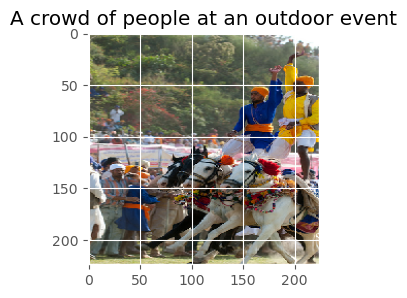

<Figure size 640x480 with 0 Axes>

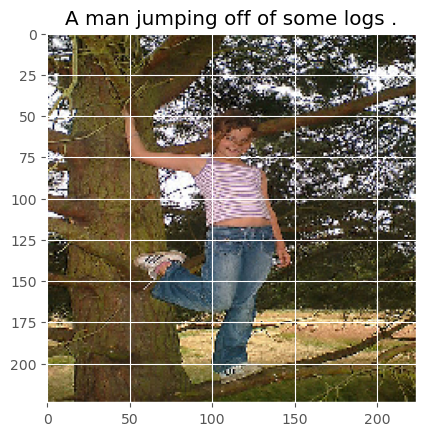

<Figure size 640x480 with 0 Axes>

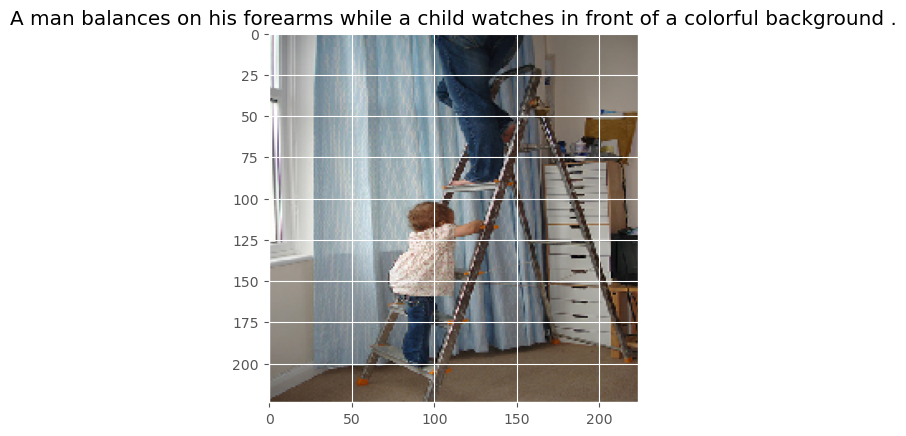

<Figure size 640x480 with 0 Axes>

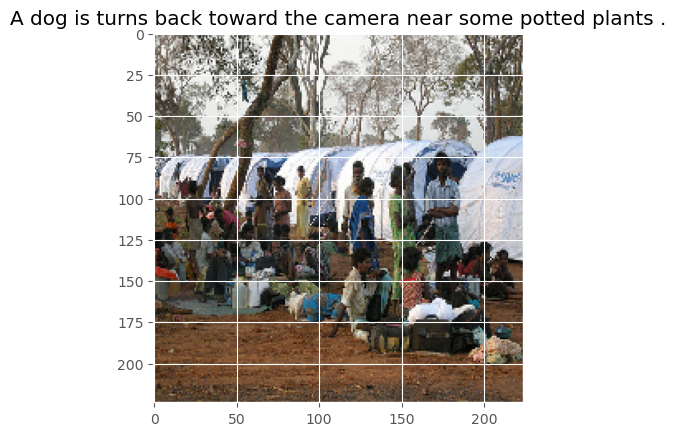

<Figure size 640x480 with 0 Axes>

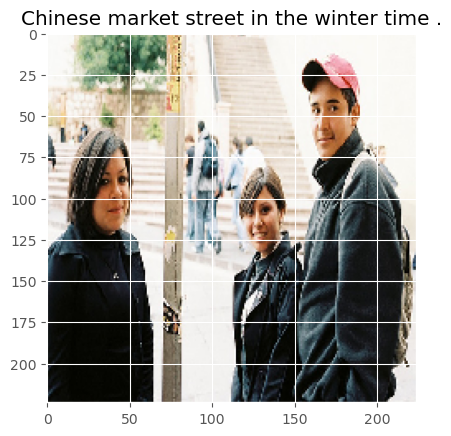

<Figure size 640x480 with 0 Axes>

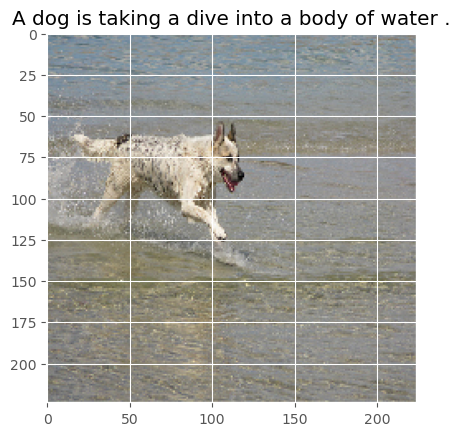

<Figure size 640x480 with 0 Axes>

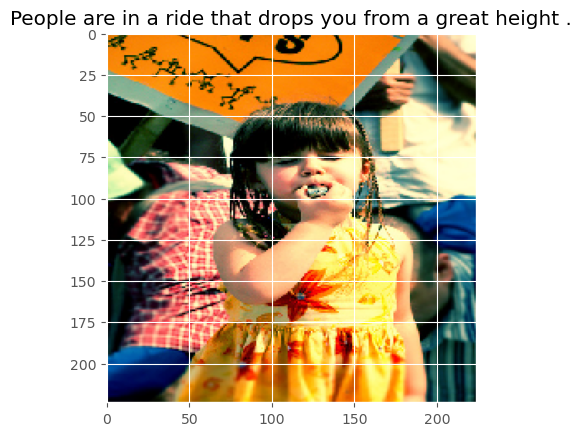

<Figure size 640x480 with 0 Axes>

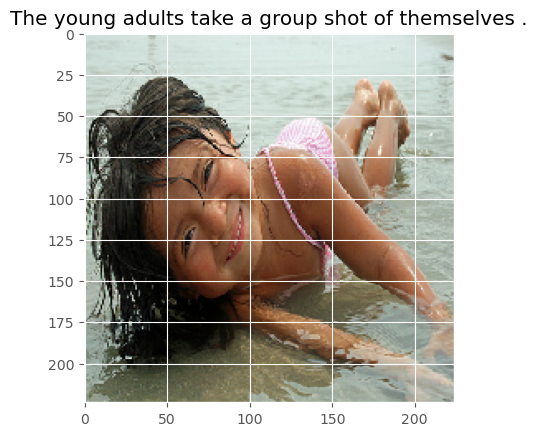

<Figure size 640x480 with 0 Axes>

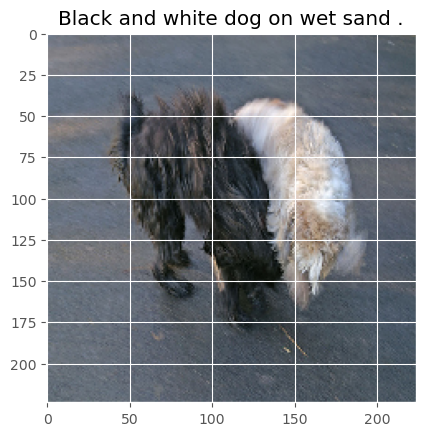

<Figure size 640x480 with 0 Axes>

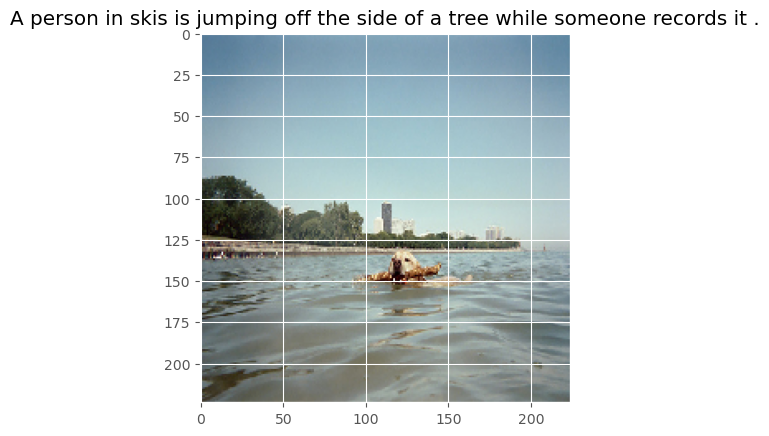

<Figure size 640x480 with 0 Axes>

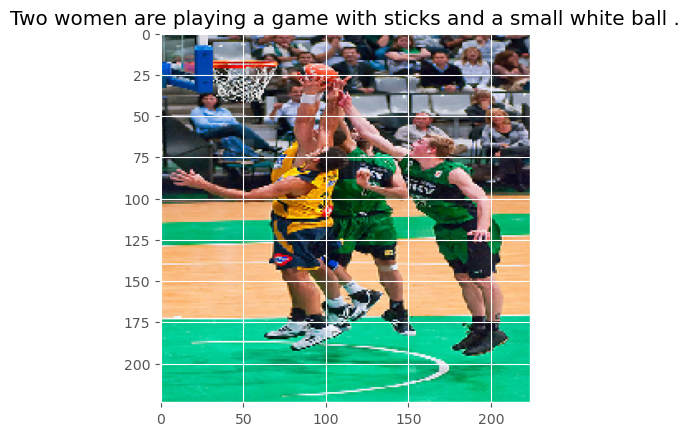

<Figure size 640x480 with 0 Axes>

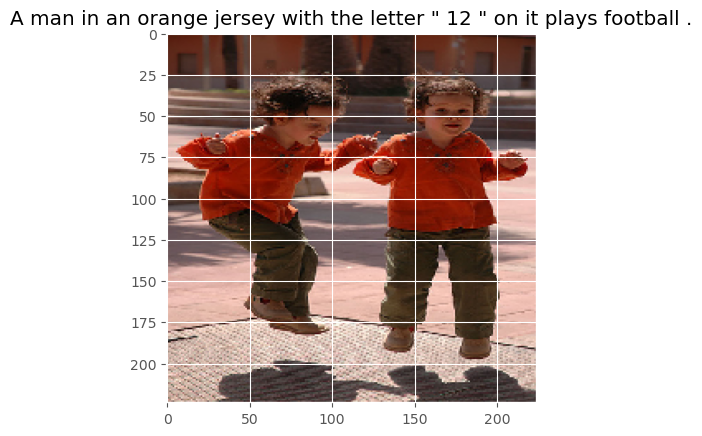

<Figure size 640x480 with 0 Axes>

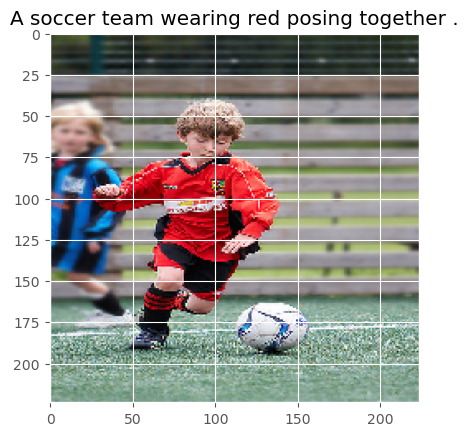

<Figure size 640x480 with 0 Axes>

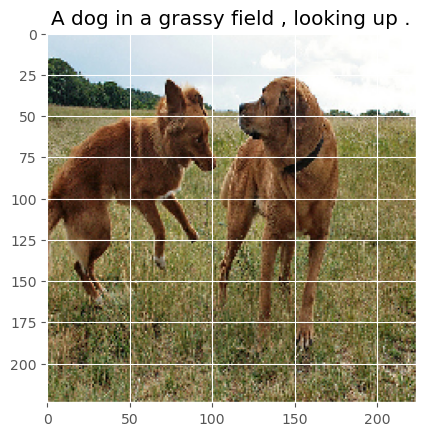

<Figure size 640x480 with 0 Axes>

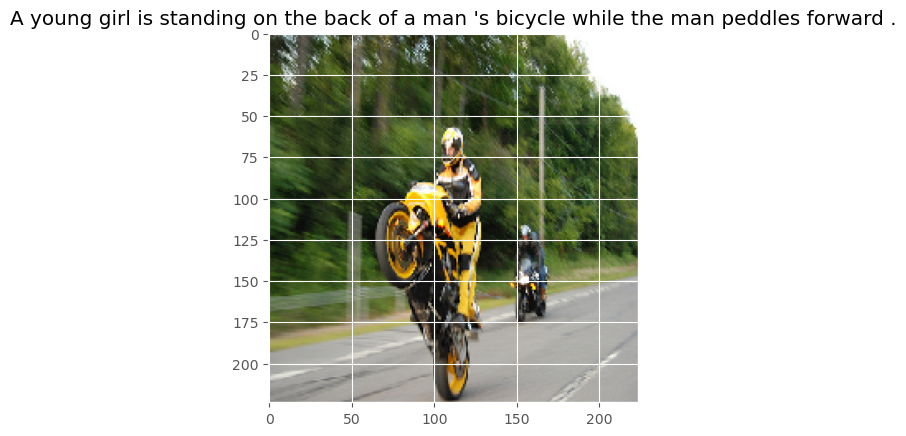

<Figure size 640x480 with 0 Axes>

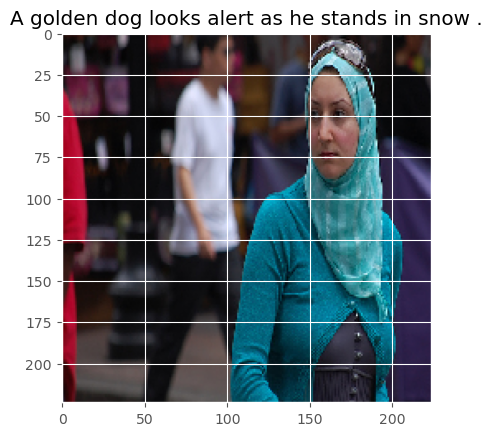

<Figure size 640x480 with 0 Axes>

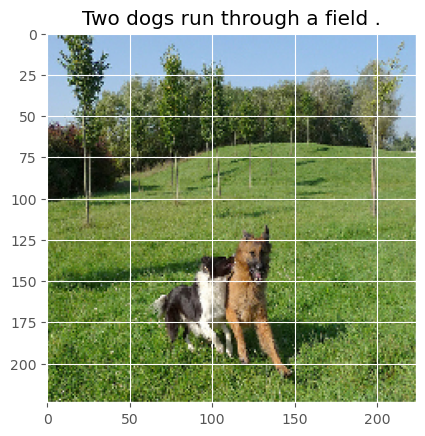

<Figure size 640x480 with 0 Axes>

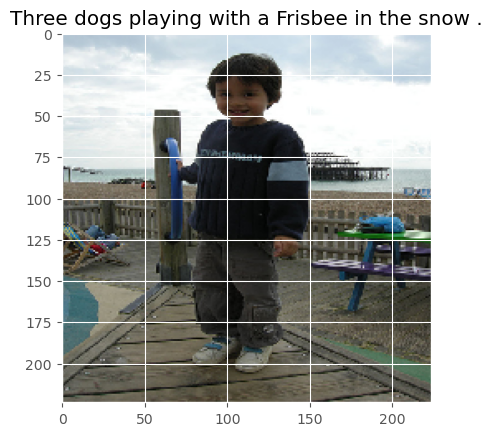

<Figure size 640x480 with 0 Axes>

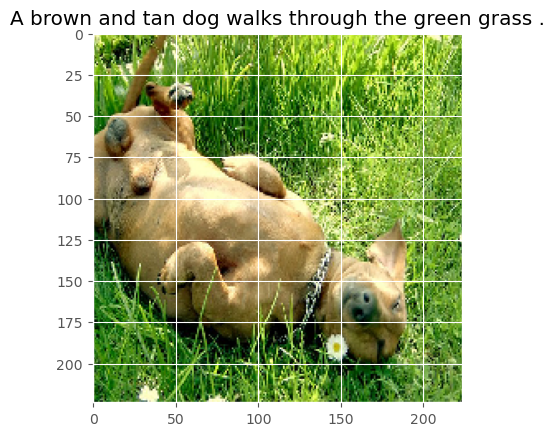

<Figure size 640x480 with 0 Axes>

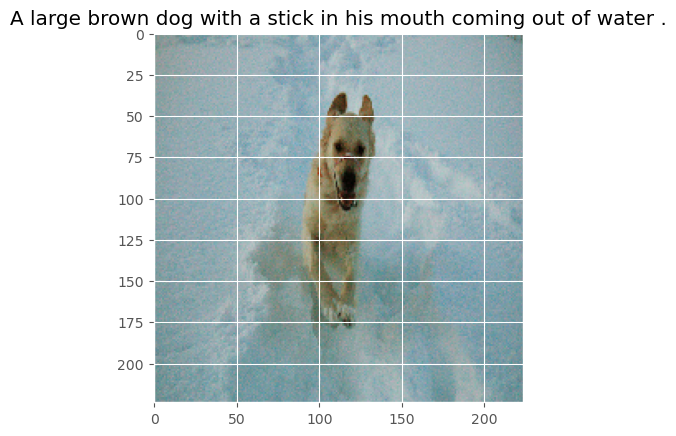

<Figure size 640x480 with 0 Axes>

In [12]:
# Отображение фотографий
fig = plt.subplots(figsize=(3, 3))

for i in range(20):
    plt.imshow(features[i])
    plt.title(target[i])
    plt.show()

    plt.tight_layout()
    plt.show()

### Выводы

Мы загрузили и ознакомились с данными.

- Датасет содержит 1000 фото на train и 100 фото на test. Фото достаточно в плохом качестве

- Некоторые фото и подписи не совпадают

- Дубликаты и пропуски отсутсвуют

- Отсутствуют пересечения данных между наборами в train и test

Перейдём к аггрегации оценок для получения тестов.

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Получилось подробное исследование. Вижу что ты не исследовла количество уникальных описаний в датасете. Также можно заметить, что в тестовом датасете все фото и изображения идеально соответствуют друг другу..</div>

## Агрегирование оценок

Для агрегации оценок экспертов и исключения пар изображение-текст, в которых эксперты дают разные оценки используем следующее:

- Напишем функцию для голосования большинства

- Создадим новый столбец в датасете экспертных оценок, который будет содержать агрегированные оценки.

- Исключим пары изображение-текст, в которых эксперты дают разные оценки.

In [13]:
# Функция для голосования большинства
def majority_vote(row):
    ratings = row.dropna() # Удаление пропущенных значений
    if ratings.empty:
        return np.nan
    counts = ratings.value_counts() # Подсчет количества проголосовавших за каждую оценку
    if counts.iloc[0] == counts.iloc[1]: # Если есть несколько оценок с максимальным количеством голосов, возвращаем NaN
        return np.nan
    return counts.index[0] # Возвращаем оценку с наибольшим количеством голосов

# Создание нового столбца для агрегированных оценок
ExpertAnnotations['aggregated_rating'] = ExpertAnnotations[[1, 2, 3, 4]].apply(majority_vote, axis=1)

# Исключение пар изображение-текст, в которых эксперты дают разные оценки
ExpertAnnotations = ExpertAnnotations.dropna(subset=['aggregated_rating'])

# Вывод результата
print("Количество оценок после агрегации и исключения пар с разными оценками:", len(ExpertAnnotations))

Количество оценок после агрегации и исключения пар с разными оценками: 5696


In [14]:
# проверим датасет
ExpertAnnotations.head()

,0,1,2,3,4,aggregated_rating
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,1.0
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,2.0
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,1.0


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 </div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
    
    
Мне кажется ты запуталась в значении столбцов датафрейма. У тебя уже есть доля людей, подтвердивших что изображение соответствует описанию среди всех людей, оценивавших эту пару. Она содержится в колонке 2. Посмотри внимательно на данные, это интуитивно понятно если присмотреться.</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   
Поняла, удалила

</div>

Для выполнения задания объединим 2 датафрейма (merged_df). Затем если есть как экспертная, так и краудсорсинговая оценки, мы применяем заданные коэффициенты веса для выбора одной из оценок (оценка эксперта с коэффициентом 0.6 и оценка краудсорсинга с коэффициентом 0.4). Если есть только экспертная оценка или только оценка краудсорсинга, мы используем ее без весового коэффициента. Если нет ни экспертной, ни краудсорсинговой оценок, мы устанавливаем значение целевой переменной в None.

In [15]:
merged_df = ExpertAnnotations.merge(CrowdAnnotations, left_on=[0, 1], right_on=[0, 1])# left_on=[0, 1] указывает столбцы 0 и 1 в ExpertAnnotations в качестве ключей объединения, а right_on=[0, 1] указывает соответствующие столбцы в CrowdAnnotations

In [16]:
merged_df = merged_df.rename(columns={0: 'name_foto'})# переименовала название колонки для дальнейшего объединения с train_dataset

In [17]:
merged_df.head()

,name_foto,1,2_x,3_x,4_x,aggregated_rating,2_y,3_y,4_y
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1,1.0,0.000000,0,3
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,1.0,0.000000,0,3
2,1056338697_4f7d7ce270.jpg,434792818_56375e203f.jpg#2,1,1,2,1.0,0.000000,0,3
3,1084040636_97d9633581.jpg,256085101_2c2617c5d0.jpg#2,2,3,3,3.0,0.333333,1,2
4,1084040636_97d9633581.jpg,3396157719_6807d52a81.jpg#2,1,2,2,2.0,0.000000,0,3


In [18]:
# Проверка наличия оценок и применение коэффициентов веса
merged_df['probability_matching'] = 0.0

for index, row in merged_df.iterrows():
    expert_rating = row['aggregated_rating']
    crowd_rating = row['2_y']  # Колонка с оценкой краудсорсинга
    
    if pd.notnull(expert_rating) and pd.notnull(crowd_rating):
        merged_df.loc[index, 'probability_matching'] = expert_rating * 0.6 + crowd_rating * 0.4
    elif pd.notnull(expert_rating):
        merged_df.loc[index, 'probability_matching'] = expert_rating
    elif pd.notnull(crowd_rating):
        merged_df.loc[index, 'probability_matching'] = crowd_rating
    else:
        merged_df.loc[index, 'probability_matching'] = None


In [19]:
#ограничим значения в столбце probability_matching от 0 до 1, отсекая любые значения, выходящие за пределы этого диапазона
merged_df['probability_matching'] = merged_df['probability_matching'].clip(0, 1) 
print(merged_df.head(10))

                   name_foto                            1  2_x  3_x  4_x  \
0  1056338697_4f7d7ce270.jpg  2549968784_39bfbe44f9.jpg#2    1    1    1   
1  1056338697_4f7d7ce270.jpg  2718495608_d8533e3ac5.jpg#2    1    1    2   
2  1056338697_4f7d7ce270.jpg   434792818_56375e203f.jpg#2    1    1    2   
3  1084040636_97d9633581.jpg   256085101_2c2617c5d0.jpg#2    2    3    3   
4  1084040636_97d9633581.jpg  3396157719_6807d52a81.jpg#2    1    2    2   
5  1096395242_fc69f0ae5a.jpg  1425069308_488e5fcf9d.jpg#2    2    2    2   
6  1096395242_fc69f0ae5a.jpg  2370481277_a3085614c9.jpg#2    1    2    2   
7  1107246521_d16a476380.jpg  2410320522_d967f0b75c.jpg#2    2    3    3   
8  1107246521_d16a476380.jpg   293327462_20dee0de56.jpg#2    2    2    3   
9  1107246521_d16a476380.jpg  3582742297_1daa29968e.jpg#2    3    3    3   

   aggregated_rating       2_y  3_y  4_y  probability_matching  
0                1.0  0.000000    0    3                   0.6  
1                1.0  0.000000   

In [20]:
# Объединяем 'train_dataset' с 'merged_df' на основе общего столбца 'image'
train_dataset = pd.merge(train_dataset, merged_df[['name_foto', 'probability_matching']], left_on='image', right_on='name_foto', how='left')

# Переименовываем столбец 'probability_matching' в объединенном фрейме данных
train_dataset.rename(columns={'probability_matching': 'merged_probability_matching'}, inplace=True)

# Удаляем ненужные столбцы 'name_foto'
train_dataset.drop(['name_foto'], axis=1, inplace=True)


Уберем все Nan заменой на среднее значение

In [21]:
# Замена NaN на среднее значение
mean_value = train_dataset['merged_probability_matching'].mean()
train_dataset['merged_probability_matching'].fillna(mean_value, inplace=True)

# Вывод результата
print("Агрегированные оценки с заполнением NaN:")
print(mean_value)

Агрегированные оценки с заполнением NaN:
0.8849790805098067


In [22]:
train_dataset.head(10)

,image,query_id,query_text,merged_probability_matching
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.6
1,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.6
2,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.6
3,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
4,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
5,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
6,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
7,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.6
8,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.0
9,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.6


<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
    
А вот здесь серьезная ошибка. Ты просто поставила два датафрейма "рядом". А нужно соединить их через merge или join (в качестве ключа должны выступать и текст и изображение).

И после этого аккуратно обработать возможные ситуации, что есть только одна оценка или есть обе оценки.
    
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   
Исправила

</div>

### Выводы
Агрегировали оценки экспертоа. Объединили датафреймы экспертов и краудсорсингов. оценки с обучающим набором данных, заполнили пропуски, удалили NaN. Перейдём к проверке данных. обработали возможные ситуации, наличие только одной оценки или двух.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Создадим словарь, в который запишем слова, связанные с детьми и подростками:

In [23]:
prohibited_words = ['child', 'children', 'kid', 'kids', 'teenager', 'teenagers', 'youth', 'infant', 'infants', 'baby', 'babies', 'newborn', 'newborns', 'boy', 'boys', 'girl', 'girls', 'schoolboy', 'schoolboys']

stop_words = set(stopwords.words('english')) 
stop_words.remove('not')

#очистим тексты:
def clear_text(text):
    text = text.lower()
    text = re.sub(r' {1,10}', ' ', text) #замена множественных пробелов на один
    text =  re.sub(r"[^a-zA-Z]", ' ', text) # оставляю только буквы латинского алфавита
    text = text.strip() #убираю первого и последнего пробела
    #text = [word for word in text if word not in stop_words] # убираем стоп-слова английского языка
    text = "".join(text) # объединяем все в строку
    return text

corpus = train_dataset['query_text'].apply(clear_text)

#### Посмотрим на результат
corpus.sample(10).unique()

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
Очень странная ситуация. По выводу хорошо видно, что чистка проведена с ошибкой и между каждой буквой пробел.  И выручает только то, что дальше ты этот  результат просто никак не используешь.
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
   
Исправила, но закоментила за недадобностью

</div>

In [24]:
# Напишем функцию для лемматизации, используя spaCy
disabled_pipes = [ "parser",  "ner"]
nlp = spacy.load('en_core_web_sm', disable=disabled_pipes)
stop_words = list(set(nlp.Defaults.stop_words))
stop_words.remove('not')

def lemmatizer(df):
    doc = nlp(df)
    lemmatized_text = " ".join([token.lemma_ for token in doc])
    return lemmatized_text

In [25]:
corpus = train_dataset['query_text'].progress_apply(lemmatizer)

  0%|          | 0/14413 [00:00<?, ?it/s]

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Идея с лемматизацией хороша. Но она очень "дорогая" - хорошая лемматизация занимает время. Поэтому я считаю возможным упростить себе жизнь - взять возможные словоформы "запрещенных" слов. Как правиль их всего две - единственное и множественное число. И ты их уже использовала
    
    
    
</div>

In [26]:
# Напишем функцию, которая будет проверять каждую строку текста на наличие запрещенных слов.
# Если запрещенное слово найдено, функция вернет False, в противном случае - True
def check_for_prohibited_words(text):
    for word in prohibited_words:
        if word in text:
            return False
    return True

In [27]:
train_dataset['lem_query_text'] = corpus
train_dataset['is_allowed'] = corpus.apply(check_for_prohibited_words)

Посмотрим количество изображений, в описании которых встечаются "запретные" слова

In [28]:
def spl(text):
    return text[:text.find('#')]

In [29]:
forb_images = train_dataset[train_dataset['is_allowed'] == False]['query_id'].apply(spl).unique()
len(forb_images)

291

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Отлично, ты получила список плохих изображений. Можно даже посмотреть на пару-тройку и убедиться что там действительно дети.</div>

In [30]:
# Удаляем строки с изображениями из списка "плохих изображений"
train_dataset = train_dataset[~train_dataset['query_id'].apply(spl).isin(forb_images)]

# Удаляем столбец 'query_text'
train_dataset.drop('query_text', axis=1, inplace=True, errors='ignore')

# Сбрасываем индексы
train_dataset.reset_index(drop=True, inplace=True)


In [31]:
# Посмотрим результат
display(train_dataset.head())
train_dataset.info()

,image,query_id,merged_probability_matching,lem_query_text,is_allowed
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.6,a man sleep under a blanket on a city street .,True
1,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.6,a man sleep under a blanket on a city street .,True
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,0.6,a man sleep under a blanket on a city street .,True
3,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,0.6,a man sleep under a blanket on a city street .,True
4,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,1.0,a man sleep under a blanket on a city street .,True


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10742 entries, 0 to 10741
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   image                        10742 non-null  object 
 1   query_id                     10742 non-null  object 
 2   merged_probability_matching  10742 non-null  float64
 3   lem_query_text               10742 non-null  object 
 4   is_allowed                   10742 non-null  bool   
dtypes: bool(1), float64(1), object(3)
memory usage: 346.3+ KB


### Выводы
Мы проверили данные и исключили из обучения все описания содержащие запрещённую информацию. Перейдём к векторизации изображений.

<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
    
Ты удалила комментарии, в которых были запрещенные слова. Но наша задача убрать изображения, содержащие детей. 
    
При этом ты удаляла все комментарии, где есть слово "ребенок" независимо от оценки соответствия....
    
И это при том, что у тебя уже есть список  "плохих изображений". Используй его и просто удали все записи, где изображение содержится в списке "плохих изображений". Это гораздо надежнее. 
    
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
исправила

</div>

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

Посмторим на результат после удаления запрещенных элементов

In [32]:
# Отображение фотографий

train_datagen = ImageDataGenerator(rescale=1./255)
train_datagen_flow = train_datagen.flow_from_dataframe(
    dataframe=train_dataset,
    directory=Path(PATH, 'train_images'),
    x_col='image',
    y_col='merged_probability_matching',
    target_size=(224,224),
    batch_size=24,
    class_mode='raw',
    seed=12345)

Found 10742 validated image filenames.


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Модель Resnet обучалась на изображениях размером 224х224, использование изображений меньшего размера ухудшает качество эмбеддингов. 
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
Исправила

</div>

In [33]:
features, target = next(train_datagen_flow)

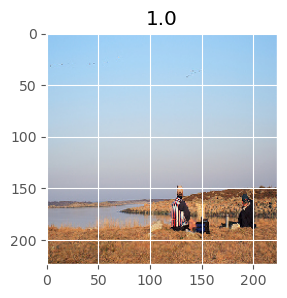

<Figure size 640x480 with 0 Axes>

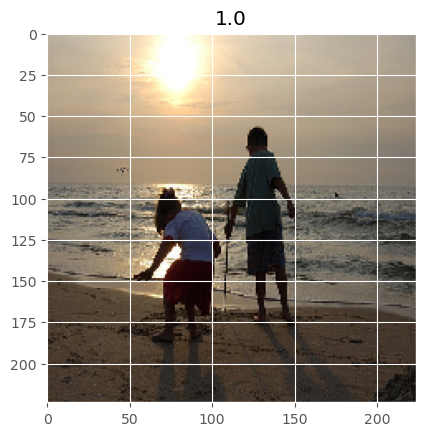

<Figure size 640x480 with 0 Axes>

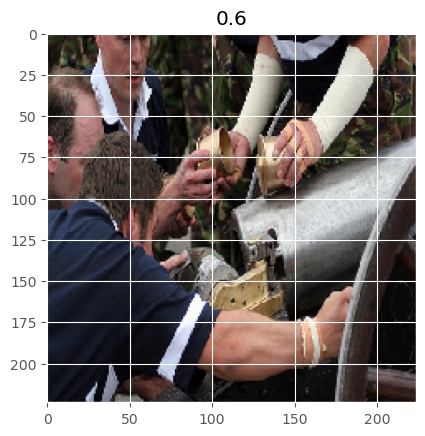

<Figure size 640x480 with 0 Axes>

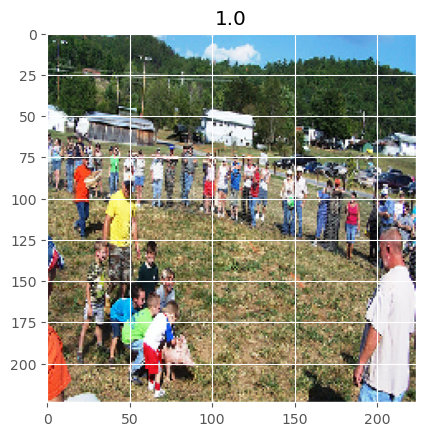

<Figure size 640x480 with 0 Axes>

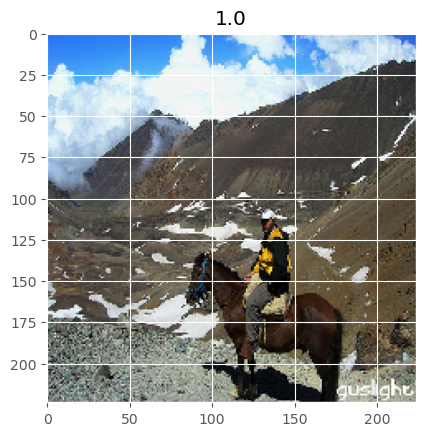

<Figure size 640x480 with 0 Axes>

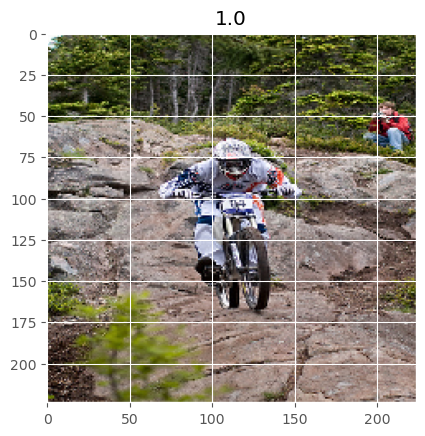

<Figure size 640x480 with 0 Axes>

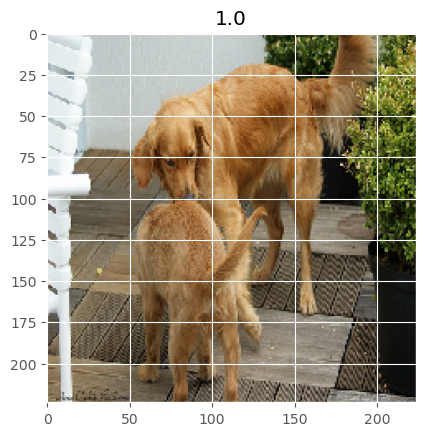

<Figure size 640x480 with 0 Axes>

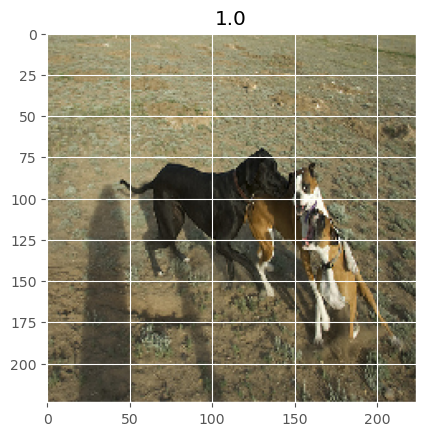

<Figure size 640x480 with 0 Axes>

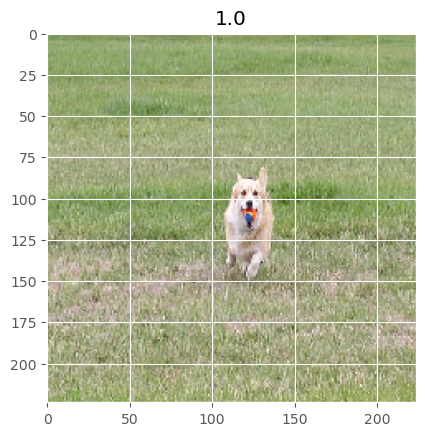

<Figure size 640x480 with 0 Axes>

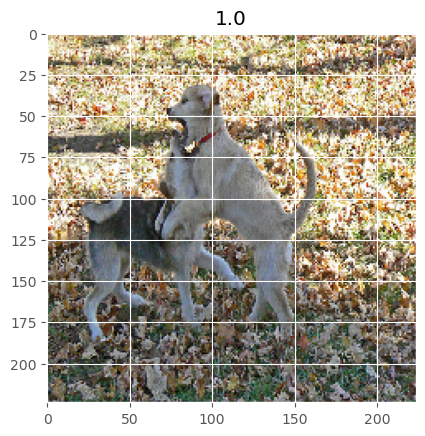

<Figure size 640x480 with 0 Axes>

In [34]:
# Отображение фотографий
fig = plt.subplots(figsize=(3, 3))

for i in range(10):
    plt.imshow(features[i])
    plt.title(target[i])
    plt.show()

    plt.tight_layout()
    plt.show()

В датасете все таки остались фото с детьми, возможно это связано с низкой оценкой или фото имеют некорректное описание (учитывались только те слова, которые вошли в массив)

In [35]:
# Загрузка предобученной модели ResNet50
def create_model(input_shape=(150, 150, 3)):

    optimizer = Adam(lr=0.0001)

    backbone = ResNet50(input_shape=input_shape,
                    weights='imagenet',
                    include_top=False)


    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())


    model.compile(optimizer=optimizer,
                  loss='mean_squared_error',
                  metrics=['mae'])

    return model

In [36]:
# Векторизация изображения
def vect_foto(model, train_data):
    predict = model.predict(train_data)
    return predict

In [37]:
# Получаем эмбеддинги

foto_embeds = vect_foto(create_model(), train_datagen_flow)

2023-06-24 14:48:34.401186: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


448/448 [==============================] - 293s 653ms/step


In [38]:
foto_embeds.shape

(10742, 2048)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Здесь все ОК, векторизация изображений произведена верно </div>

### Вывод
Мы получили эмбединги, воспользовавшись моделью ResNet50

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


Для векторизации тектов применим трансформер BERT

In [39]:
# Загрузка предварительно обученной модели BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = TFBertModel.from_pretrained('bert-base-uncased')

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Молодец, что используешь модель с бэкэндом TF </div>

In [40]:
# Предварительная обработка текста и получение токенов
text = list(train_dataset['lem_query_text'])
encoded_inputs = tokenizer(text, padding=True, truncation=True, max_length=512, return_tensors='tf')

In [41]:
# Получение векторных представлений текста с помощью BERT
outputs = model(**encoded_inputs)
last_hidden_state = outputs.last_hidden_state.numpy()

# Выбор данных с нулевого токена
embeddings = last_hidden_state[:, 0, :]


<img src="https://upload.wikimedia.org/wikipedia/commons/b/ba/Warning_sign_4.0.png" align=left width=44, heigth=33>
<div class="alert alert-warning">
Вот здесь есть маленький нюанс. Ты берешь выход pooler_output, но если почитать документацию, окажется что это выход с нулевого токена, пропущенный через линейный слой и дополнительную нелинейность. И этот слой не очень хорошо подходит для задачи семантического соответствия.
    
Вспомни, какие были рекомендации в спринте по текстам. Стоит взять [0][:,0,:]. Где [0] подтянет last_hidden_state, и из него мы выберем только даннные с нулевого токена.
    
    
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
Исправила

</div>

In [42]:
# Результат - массив с векторными представлениями текста
print("Размерность массива embeddings:", embeddings.shape)
print("Векторные представления текста:", embeddings)

Размерность массива embeddings: (10742, 768)
Векторные представления текста: [[ 2.1454221e-01 -1.5482941e-01 -4.3671200e-01 ... -1.5983862e-01
   3.4962520e-01  1.6654037e-01]
 [ 2.1454221e-01 -1.5482941e-01 -4.3671200e-01 ... -1.5983862e-01
   3.4962520e-01  1.6654037e-01]
 [ 2.1454221e-01 -1.5482941e-01 -4.3671200e-01 ... -1.5983862e-01
   3.4962520e-01  1.6654037e-01]
 ...
 [-5.6746757e-01 -1.8398523e-01 -6.3832468e-01 ... -1.4744344e-01
   1.6932377e-01  5.4819413e-02]
 [-1.5125063e-01 -5.1268853e-02 -3.7589586e-01 ... -1.7390198e-01
   3.4454465e-04 -2.1719652e-01]
 [-1.5125063e-01 -5.1268853e-02 -3.7589586e-01 ... -1.7390198e-01
   3.4454465e-04 -2.1719652e-01]]


### Вывод
Мы получили эмбединги, воспользовавшись трансформером Bert. Перейдём к соеденению двух получившихся векторов

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [43]:
# Объединение векторов изображений и векторов текстов
features = np.concatenate((foto_embeds, embeddings), axis=1)
features.shape

(10742, 2816)

In [44]:
target = np.array(train_dataset['merged_probability_matching'])
target.shape

(10742,)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 Вектора, полученные из текста и изображения объеденены👍 </div>

### Вывод

Получившиеся пары векторов после объединения будут иметь следующие размерности:

Векторы изображений: (n, m1)

n - количество объектов (примеров), для которых имеются векторы изображений.
m1 - размерность векторов изображений. Каждый вектор изображения представлен в виде одномерного массива размерности m1.

Векторы текстов: (n, m2)

n - количество объектов (примеров), для которых имеются векторы текстов.
m2 - размерность векторов текстов. Каждый вектор текста представлен в виде одномерного массива размерности m2.

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

In [45]:
# разобьем датасет на train и test

groups = train_dataset['image']

gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)

train_indices, test_indices = next(gss.split(X=features, y=target, groups=groups))

features_train, features_test = features[train_indices], features[test_indices]
target_train, target_test = target[train_indices], target[test_indices]

In [46]:
# посмотрим размерность
print(features_train.shape, features_test.shape, target_train.shape, target_test.shape)

(7630, 2816) (3112, 2816) (7630,) (3112,)


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, благодаря использованию GroupShuffleSplit ты исключаешь попадание одного изображения в обучающий и валидационный наборы.</div>

In [47]:
# Проведём нормализацию

scaler = StandardScaler().fit(features_train)
features_train = scaler.transform(features_train)
features_test = scaler.transform(features_test)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Молодец что учишь скаллер на обучающем наборе</div>

Выберем метрику для измерения качества моделей RMSE (т.к. она часто используется в задачах регрессии и более чувствительна к большим ошибкам, чем MAE). так же многие алгоритмы и методы оптимизации направлены на минимизацию среднеквадратической ошибки. Использование RMSE позволяет легче адаптировать и применять эти методы оптимизации к моделям

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
В этом задании требуется выбрать основную метрику, которую ты будешь оптимизировать. Я вижу что ты уже выбрала метрику rmse, поэтому просто напиши обоснование для своего выбора.  </div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>образец комментария студента</b></font>
   
Комментарий уже был, только после кодов

</div>

### Модель LinearRegression

In [48]:
%%time
lr_model = LinearRegression()
scores = cross_val_score(lr_model,
                         features_train,
                         target_train,
                         groups=groups.loc[train_indices],
                         cv=GroupShuffleSplit(random_state=42),
                         scoring='neg_root_mean_squared_error')
rmse = abs(scores.mean()).round(decimals=3)

print("RMSE:", rmse)

RMSE: 138.473
CPU times: user 2min 22s, sys: 2.18 s, total: 2min 24s
Wall time: 19.1 s


<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
С точки зрения теории все правильно, даже кросс-валидация использована GroupShuffleSplit.

Но конкретно здесь можно рассматривать только что отрезанную тестовую выборку как валидационную и валидироваться на ней, а отложенные данные (в отдельном датафрейме) это и будут тестовые данные, на которых мы проведем тестирование.
</div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 Линейная регрессия склонна к переобучению в случае скоррелированности (мультиколлинеарности) признаков.  Поэтому стоит попробовать её родственников с регуляризацией (ridge/lasso)</div>

Эта модель совсем не работает. Попробую другой вариант линейной регрессии

### Модель LinearSVR

In [49]:
model = LinearSVR(random_state=12345)

param_grid = {
    'loss':['squared_epsilon_insensitive'],
    'C':[1]
}

gs_svr = GridSearchCV(
    model,
    param_grid,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1,
    cv=GroupShuffleSplit(n_splits=3, random_state=12345),
    verbose=1
)

In [50]:
%time
gs_svr.fit(features_train, target_train, groups=groups.loc[train_indices])
None

CPU times: user 8 µs, sys: 16 µs, total: 24 µs
Wall time: 6.91 µs
Fitting 3 folds for each of 1 candidates, totalling 3 fits


/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.10/site-packages/sklearn/svm/_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [51]:
scores_gs_svr = gs_svr.cv_results_['mean_test_score']
final_score_gs_svr = abs(scores_gs_svr.mean()).round(decimals=3)
print("RMSE:", final_score_gs_svr)

RMSE: 0.241


Уже лучше результат

### Модель полносвязной нейронной сети

In [52]:
model_pn = Sequential()
model_pn.add(Dense(1024, activation='relu', input_shape=(2816,)))
model_pn.add(Dropout(0.2))
model_pn.add(Dense(512, activation='tanh'))
model_pn.add(Dropout(0.2))
model_pn.add(Dense(256, activation='relu'))
model_pn.add(Dropout(0.2))
model_pn.add(Dense(128, activation='tanh'))
model_pn.add(Dropout(0.2))
model_pn.add(Dense(64, activation='relu'))
model_pn.add(Flatten())
model_pn.add(Dense(1, activation='linear'))

optimizer = Adam(learning_rate=0.0001)
model_pn.compile(optimizer=optimizer, loss='mean_squared_error', metrics=[tf.keras.metrics.RootMeanSquaredError()])

model_pn.fit(features_train,
          target_train,
          epochs=10,
          batch_size=32,
          validation_data=(features_test, target_test),
          shuffle=True,
          verbose=2)


Epoch 1/10
239/239 - 2s - loss: 0.1234 - root_mean_squared_error: 0.3513 - val_loss: 0.0427 - val_root_mean_squared_error: 0.2067 - 2s/epoch - 9ms/step
Epoch 2/10
239/239 - 2s - loss: 0.0654 - root_mean_squared_error: 0.2558 - val_loss: 0.0428 - val_root_mean_squared_error: 0.2068 - 2s/epoch - 7ms/step
Epoch 3/10
239/239 - 2s - loss: 0.0523 - root_mean_squared_error: 0.2286 - val_loss: 0.0344 - val_root_mean_squared_error: 0.1854 - 2s/epoch - 7ms/step
Epoch 4/10
239/239 - 2s - loss: 0.0452 - root_mean_squared_error: 0.2125 - val_loss: 0.0308 - val_root_mean_squared_error: 0.1756 - 2s/epoch - 7ms/step
Epoch 5/10
239/239 - 2s - loss: 0.0420 - root_mean_squared_error: 0.2051 - val_loss: 0.0307 - val_root_mean_squared_error: 0.1753 - 2s/epoch - 7ms/step
Epoch 6/10
239/239 - 2s - loss: 0.0398 - root_mean_squared_error: 0.1996 - val_loss: 0.0311 - val_root_mean_squared_error: 0.1763 - 2s/epoch - 7ms/step
Epoch 7/10
239/239 - 2s - loss: 0.0377 - root_mean_squared_error: 0.1941 - val_loss: 0.0

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
 👍 

Если модель вышла на плато можно попробовать трюк - уменьшить lr на порядок и попробовать продолжить обучение.
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментария студента</b></font>
Немного изменила learning_rate=0.0001 (было learning_rate=0.001)

</div>

В данной модели RMSE показал немного лучше вариант (0.17) против LinearSVR (RMSE = 0.24). Проверим Модель полносвязной нейронной сети на тесте

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

Тестирование Модели полносвязной нейронной сети на тесте

In [53]:
# Получение прогнозов
predictions = model_pn.predict(features_test)

# Вычисление RMSE
rmse_value = mean_squared_error(target_test, predictions, squared=False)
rmse_value = round(rmse_value, 3)
print("Test RMSE:", rmse_value)


98/98 [==============================] - 0s 2ms/step
Test RMSE: 0.175


Вывод: Значение метрики практически не изменилось. Модель рабочая

Получим эмбеддинги для всех тестовых изображений

In [54]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_datagen_flow = test_datagen.flow_from_dataframe(
    dataframe=test_images,
    directory=Path(PATH, 'test_images'),
    x_col='image',
    y_col=None,
    target_size=(224,224),
    batch_size=24,
    class_mode='input',
    seed=12345)

features, target = next(test_datagen_flow)

Found 100 validated image filenames.


In [55]:
# Загрузка предобученной модели ResNet50
def create_model(input_shape=(224, 224, 3)):

    optimizer = Adam(lr=0.0001)

    backbone = ResNet50(input_shape=input_shape,
                    weights='imagenet',
                    include_top=False)


    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())


    model.compile(optimizer=optimizer,
                  loss='mean_squared_error',
                  metrics=['mae'])

    return model

In [56]:
# Векторизация изображения
def vect_images(model, test_images):
    predict = model.predict(test_images)
    return predict

In [57]:
# Получаем эмбеддинги

images_embeds_test = vect_images(create_model(), test_datagen_flow)

5/5 [==============================] - 3s 512ms/step


In [58]:
images_embeds_test.shape

(100, 2048)

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Отлично, "заранее" векторизовали изображения </div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
    
А вот векторизовать тексты заранее нет смысла. Ведь ты пишешь функцию, которая умеет работать с любым текстом (и это правильно). Соответственно текст должен векторизоваться "на лету".</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
Перенесла все в функцию

</div>

In [59]:
def check_for_prohibited_words_with_array(text, prohibited):
    for word in prohibited:
        if word in text:
            return True
    return False

In [60]:
# Загрузка предварительно обученной модели BERT
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = TFBertModel.from_pretrained('bert-base-uncased')
text = list(test_queries['query_text'])
def image(text) -> None:
    if [word for word in lemmatizer(text) if check_for_prohibited_words_with_array(text, prohibited_words)]: # проверка для слов попавших в запрещенку
        print('-' * 100)
        print()
        print(text)
        print()
        string = 'This image is unavailable in your country in compliance with local laws'.upper()
        print(f'## \033[1m{string}\033[0m ##')
        print()
    else:
        encoded_inputs = tokenizer(text, padding=True, truncation=True, max_length=512, return_tensors='tf')
        outputs = model(**encoded_inputs)
        embeddings_text_test = outputs.pooler_output.numpy()
        images_embeds_test
        embed_test_images_text = np.concatenate(( 
                                    images_embeds_test,
                                    np.resize(embeddings_text_test, (images_embeds_test.shape[0], 768))),
                                    axis=1)
        embed_test_images_text_sc = scaler.transform(embed_test_images_text)
        predictions = model_pn.predict(embed_test_images_text_sc) # Получение предсказаний для тестовых изображений с использованием модели
        df = pd.concat((test_images, pd.Series(np.reshape(predictions, (predictions.shape[0],)), name='pred')), axis=1) # Соединим оценки и картинки
        main_name = list(df.sort_values(by='pred', ascending=False)['image'].head(10)) # Получение списка имен файлов изображений, которые имеют наивысшие предсказания
        main_score = list(df.sort_values(by='pred', ascending=False)['pred'].head(10)) # Получение списка наивысших предсказаний для изображений
        
        # Нормализация меры близости в диапазоне от 0 до 1
        normalized_scores = (main_score - np.min(main_score)) / (np.max(main_score) - np.min(main_score))
       
        print('')
        print('-' * 20, text, '-' * 20)
        print('')
        
        for i in range(5): # Перебор первых пяти наиболее похожих изображений
            print(f"Найденная мера близости: Image: {main_name[i]}, Score: {round(normalized_scores[i], 2)}")

        if text in list(test_queries['query_text']): 
            print(f"Input Text Image: {test_queries.iloc[test_queries[test_queries['query_text'] == text].index[0]]['image']}")

        print()
        
        fig = plt.figure(figsize=(15, 5))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(5): # Перебор первых пяти наиболее похожих изображений
            fig.add_subplot(1, 6, i+1, title=f'Score: {round(normalized_scores[i], 2)}')
            image = Image.open(Path(PATH, 'test_images', main_name[i]))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        if text in list(test_queries['query_text']): 
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image = Image.open(Path(PATH, 'test_images', test_queries.iloc[test_queries[test_queries['query_text'] == text].index[0]]['image']))
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        
        plt.show()

    return None


Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
    
Я немного "поковырял" твою функцию и нашел ошибку. Она никак не зависит от входящего текста. Ты его  обрабатываешь, векторизуешь, а затем получаешь предсказание на таблице `embed_test_images_text_sc`

Давай все-таки будем использовать рассчитаный эмбеддинг текста. Тогда для разных текстов предсказания должны получиться разные.
</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
я немного изменила функцию, но я не очень понимаю где ошибка, потому что я токинизирую текст на 15 строчке который принимаю аргументом фунции image 

</div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Но архитектурно решение верное. Есть функция умеющая работать с любым текстом, векторизация текста прозводится внутри + производится конттроль запрещенного контента.
</div>

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/8/81/Stop_sign.png/240px-Stop_sign.png" align=left width=35, heigth=35>
<div class="alert alert-danger">
Небольшая формальность - пожалуйста добавь в код функции , чтобы она кроме изображения и текста  выводила найденную меру близости.</div>

<div class="alert" style="background-color:#ead7f7;color:#8737bf">
    <font size="3"><b>комментарий студента</b></font>
сделала

</div>

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Что касается последней фотогарфии и идеального совпадения. Причина здесь не в качестве модели. Просто шестую фотографию ты ищешь в тестовом датафрейме по запросу. А как мы помним в тествоом датафрейме все изборажения идеально сооветствуют запросам.
</div>

In [61]:
# выведем случайные 10 запросов из файла test_queries.csv и для каждого запроса выведим наиболее релевантное изображение
example = test_queries.sample(10)
text_test = list(example['query_text'])
text_test

['A young man sits on a cliff , watching the ocean .',
 'A group of six men stand in a circle playing instruments in a wooded parking lot .',
 'A dog is jumping into a pool for a swim competition',
 'Woman with glasses working at a sewing machine .',
 'A brown dog and a black and white dog stand beside a hole in the dirt .',
 'Stretched image of a brown dog with a white patch of fur in his chest area sitting in the grass with trees in the background .',
 'Man rides on bicycle as other people walk .',
 'a little white and tan dog running through the grass with a stick in his mouth .',
 'Grey horse wearing blue cover eating from a orange bucket held by a person in a green shirt .',
 'Two people are sitting on a wooden structure near a tree while conversing .']

4/4 [==============================] - 0s 3ms/step
[1.         0.70920011 0.46530323 0.24669848 0.05351672 0.03572028
 0.0249405  0.00984361 0.00415973 0.        ]

-------------------- A young man sits on a cliff , watching the ocean . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.71
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.47
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.25
Найденная мера близости: Image: 2597308074_acacc12e1b.jpg, Score: 0.05
Input Text Image: 345785626_9fa59f38ce.jpg



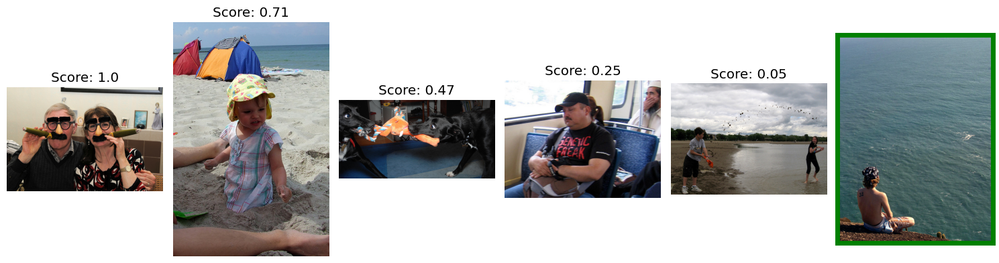

4/4 [==============================] - 0s 2ms/step
[1.         0.7051373  0.47480611 0.27055089 0.10303811 0.09517943
 0.04776997 0.04214069 0.0283622  0.        ]

-------------------- A group of six men stand in a circle playing instruments in a wooded parking lot . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.71
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.47
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.27
Найденная мера близости: Image: 424307754_1e2f44d265.jpg, Score: 0.1
Input Text Image: 3398788809_25c71ba018.jpg



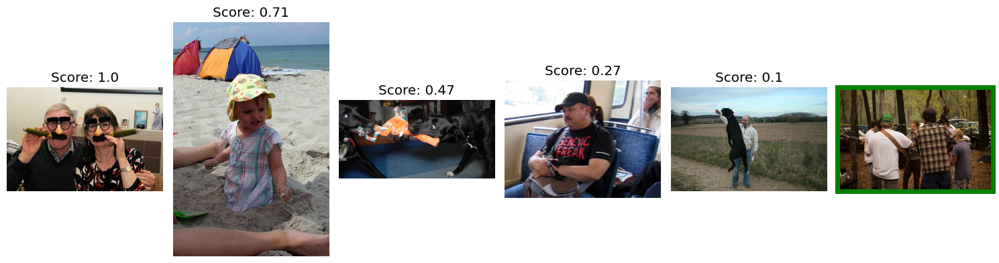

4/4 [==============================] - 0s 2ms/step
[1.         0.72987127 0.45427385 0.33116688 0.06152347 0.04620137
 0.01116966 0.00640398 0.0012422  0.        ]

-------------------- A dog is jumping into a pool for a swim competition --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.73
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.45
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.33
Найденная мера близости: Image: 2597308074_acacc12e1b.jpg, Score: 0.06
Input Text Image: 3044359043_627488ddf0.jpg



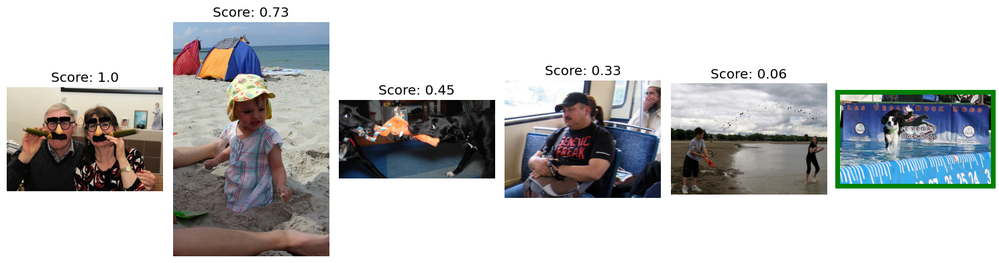

4/4 [==============================] - 0s 3ms/step
[1.         0.71919875 0.44563792 0.20849682 0.06503487 0.04292241
 0.01759239 0.01717454 0.0047135  0.        ]

-------------------- Woman with glasses working at a sewing machine . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.72
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.45
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.21
Найденная мера близости: Image: 2597308074_acacc12e1b.jpg, Score: 0.07
Input Text Image: 2887171449_f54a2b9f39.jpg



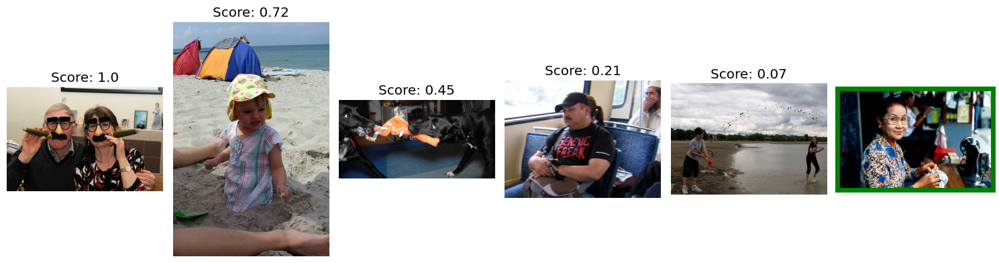

4/4 [==============================] - 0s 3ms/step
[1.         0.73258441 0.44567479 0.32462382 0.15561739 0.08007566
 0.07012492 0.05820135 0.02993102 0.        ]

-------------------- A brown dog and a black and white dog stand beside a hole in the dirt . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.73
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.45
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.32
Найденная мера близости: Image: 424307754_1e2f44d265.jpg, Score: 0.16
Input Text Image: 634891010_9fa189effb.jpg



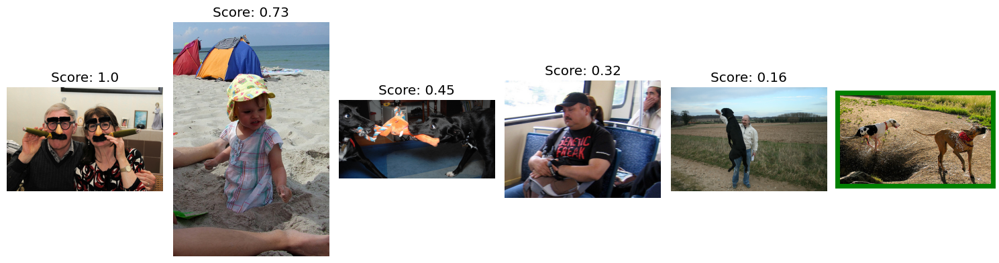

4/4 [==============================] - 0s 2ms/step
[1.         0.75537675 0.41231088 0.26234476 0.08071    0.05667634
 0.04802558 0.04016809 0.0222758  0.        ]

-------------------- Stretched image of a brown dog with a white patch of fur in his chest area sitting in the grass with trees in the background . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.76
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.41
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.26
Найденная мера близости: Image: 2597308074_acacc12e1b.jpg, Score: 0.08
Input Text Image: 1745110280_0cbff5e273.jpg



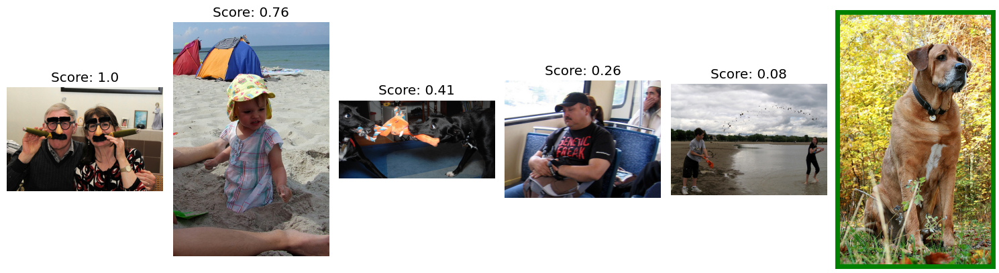

4/4 [==============================] - 0s 3ms/step
[1.         0.70047765 0.38476203 0.19092403 0.01237683 0.01074586
 0.00869683 0.00603446 0.00160531 0.        ]

-------------------- Man rides on bicycle as other people walk . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.7
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.38
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.19
Найденная мера близости: Image: 2107838729_a527e434bd.jpg, Score: 0.01
Input Text Image: 3517023411_a8fbd15230.jpg



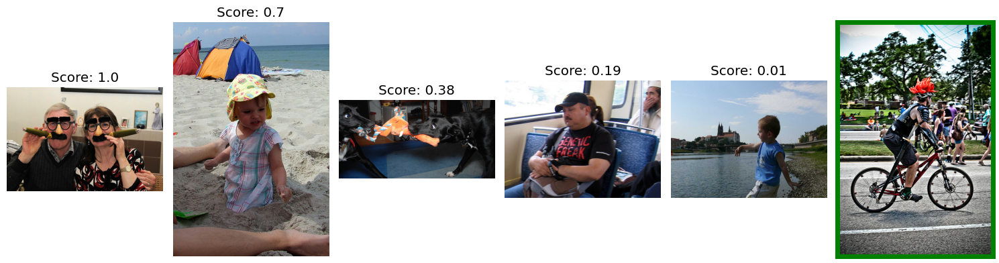

4/4 [==============================] - 0s 3ms/step
[1.00000000e+00 7.34239299e-01 4.60311316e-01 3.29725057e-01
 1.05268337e-01 6.90646934e-02 2.26228599e-02 1.90008101e-02
 4.58872717e-04 0.00000000e+00]

-------------------- a little white and tan dog running through the grass with a stick in his mouth . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.73
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.46
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.33
Найденная мера близости: Image: 424307754_1e2f44d265.jpg, Score: 0.11
Input Text Image: 3466891862_9afde75568.jpg



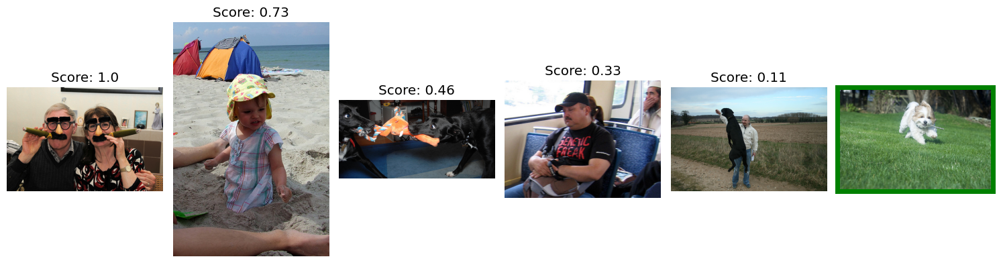

4/4 [==============================] - 0s 3ms/step
[1.         0.79135954 0.4791662  0.28444425 0.10764757 0.10486612
 0.03842982 0.02981681 0.02396541 0.        ]

-------------------- Grey horse wearing blue cover eating from a orange bucket held by a person in a green shirt . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.79
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.48
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.28
Найденная мера близости: Image: 2597308074_acacc12e1b.jpg, Score: 0.11
Input Text Image: 1580671272_3e99d94305.jpg



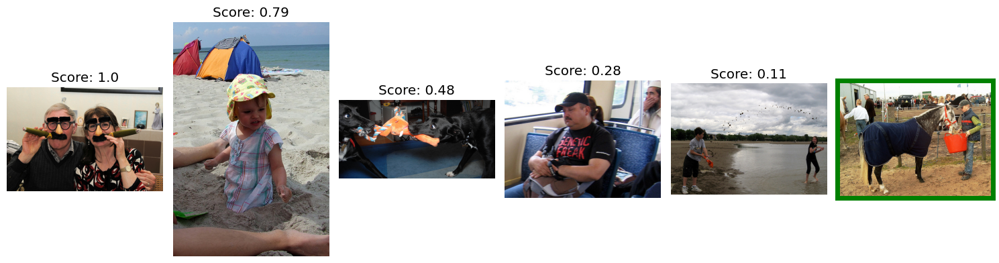

4/4 [==============================] - 0s 3ms/step
[1.         0.67875385 0.40354502 0.17959381 0.13933558 0.10272376
 0.06808019 0.01510868 0.00655531 0.        ]

-------------------- Two people are sitting on a wooden structure near a tree while conversing . --------------------

Найденная мера близости: Image: 3170110692_d1e0e66cee.jpg, Score: 1.0
Найденная мера близости: Image: 3730011701_5352e02286.jpg, Score: 0.68
Найденная мера близости: Image: 3553476195_fb3747d7c1.jpg, Score: 0.4
Найденная мера близости: Image: 2714674623_8cd05ac114.jpg, Score: 0.18
Найденная мера близости: Image: 3517023411_a8fbd15230.jpg, Score: 0.14
Input Text Image: 3520936130_9e90872560.jpg



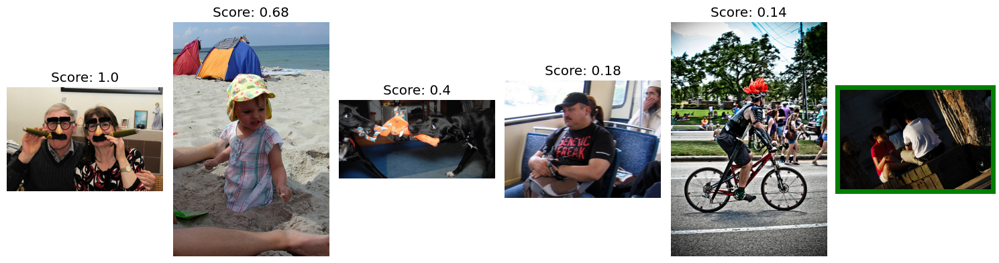

In [62]:
for text in text_test:
    image(text)

Вывод: при тестирование модели выводится достаточно хороший результат. Запрещенный контент блокируется, а надписи точно соответствуют фото

<img src="https://emojigraph.org/media/apple/check-mark-button_2705.png" align=left width=33, heigth=33>
<div class="alert alert-success">
Когда ты перепишеьшь функцию, скорее всего увидишь,что соответствие между запросами и найденными изображениями очень слабое (если вообще есть). Не стоит пугаться, это скорее норма. Неприятный, но ожидаемый результат.  И причин тут несколько - мало данных, не очень правильный подход. На мой взгляд более перспективным было бы привести ембеддинги изображений и текстов к одной размерности в одно пространство (через обучаемые слои) и в качестве меры близости использовать косинусное расстояние.
</div>

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Идеи и альтернативные подходы</b>
  Если хочешь получить хорошо работающее решение без обучения, то можешь провести эксперимент с нейронной сетью CLIP от OPEN AI (это не обязательно, только если хочешь добиться хороших результатов в этом проекте).

  Про эту нейронку много где написано, но можешь посмотреть например вот здесь  https://habr.com/ru/post/539312/.

  А для написания  реализации наиболее удобной лично для меня оказалась библиотека sbert. https://www.sbert.net/examples/applications/image-search/README.html  
    
    
</div>

## Вывод

На 1-ом этапе был проведен анализ датафрейма (некоторые фото и подписи не совпадают логически, дубликаты и пропуски отсутсвуют, так же нет пересечений данных между наборами в train и test).

Далее мы агрегировали оценки эксперов и краудсорсинга и объелинили их (для выполнения задания объединили 2 датафрейма (merged_df). Затем если была как экспертная, так и краудсорсинговая оценки, мы применяли заданные коэффициенты веса для выбора одной из оценок (оценка эксперта с коэффициентом 0.6 и оценка краудсорсинга с коэффициентом 0.4). Если только экспертная оценка или только оценка краудсорсинга, мы использовали ее без весового коэффициента. Если нет ни экспертной, ни краудсорсинговой оценок, мы устанавливаем значение целевой переменной в None.).

Потом проводилась проверка данных содержащих запрещённую информацию (такие данные исключили из обучения)

Для представления изображений в виде числовых векторов мы использовали модель ResNet50, которая позволяет извлекать важные признаки из изображений. Для представления текстовых описаний мы применили модель BERT, которая способна эффективно векторизовать текст.

Далее мы объединили векторы изображений и текстовые эмбеддинги.

Следующая задача -  оценка схожести между описаниями и изображениями на основе экспертных оценок. Для этого мы исследовали три модели: LinearRegression, LinearSVR и модель полносвязной нейронной сети. Наиболее успешными оказались результаты нейронной сети, поэтому мы провели дополнительные тесты с использованием этой модели.

В принципе выбранный подход показал себя неплохо. При тестирование модели выводится достаточно хороший результат. Запрещенный контент блокируется, а надписи точно соответствуют фото (но надо еще учесть, что в тестовом наборе надписи и фото соответствуют друг другу)


В целом, данное исследование является шагом в разработке системы поиска изображений, но требует дальнейших исследований и улучшений для достижения более точных и релевантных результатов.

## 8. Выводы

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Исследовательский анализ данных выполнен
- [x]  Проверены экспертные оценки и краудсорсинговые оценки
- [x]  Из датасета исключены те объекты, которые выходят за рамки юридических ограничений
- [x]  Изображения векторизованы
- [x]  Текстовые запросы векторизованы
- [x]  Данные корректно разбиты на тренировочную и тестовую выборки
- [x]  Предложена метрика качества работы модели
- [x]  Предложена модель схожести изображений и текстового запроса
- [x]  Модель обучена
- [x]  По итогам обучения модели сделаны выводы
- [x]  Проведено тестирование работы модели
- [x]  По итогам тестирования визуально сравнили качество поиска

<img src="http://s3.amazonaws.com/pix.iemoji.com/images/emoji/apple/ios-12/256/waving-hand.png" align=left width=44, heigth=44>
<div class="alert alert-info">
<b> Заключительный комментарий</b>
Подведем итоги. Я вижу, что в целом с проектом ты справляешься.
    
Получены признаки из текста и изображений, обучена модель регрессии. 
    
Что нужно доделать обязательно:
    
- убрать хадкод путей
- для краудсорс оценок лучше взять уже рассчитанную в данных долю 
- нельзя просто так "поставить" два датафрейма рядом, если в них оценки для разных изображений и описаний
- чистка данных проведена с ошибкой
- нужно обосновать выбор используемой метрики
- не нужно векторизовать тексты заранее, делай это "на лету" внутри функции
- нужно исправить ошибку внутри функции, которая выполняет поиск изображения по описанию
- нужно добавить вывод метрики близости
    
Желтые комментарии на твое усмотрение.
    
Жду твою работу на повторное ревью.
</div>